## CMPINF 2100 FINAL PROJECT PROPOSAL
### Travis Rogan

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Question A

I will be doing the Pitt Off-Field Analytics assignment for my final project. I chose this project because it alligns with my future career goals of working in either on or off-field analytics in the sports industry. This dataset and associated project problem are the exact kind of real-world scenario that I need to know how to be able to do, and be able to showcase to future employers. While the dataset is large, it is still quite managable which also made the project appealing to me as this will be my first attempt at doing data analysis. 

A.e:
After working through this data, I stand by my decision to work on this project. While the overall concepts are still new to me, leaving me unsure of the quality of my work at this juncture, I still **want** to know how to be able to do projects like this, and thus would not change to a different dataset

In [2]:
pitt_df = pd.read_csv('pitt_athletics_cmpinf2100_project.csv')

In [3]:
pitt_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3360 entries, 0 to 3359
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   accountid           3360 non-null   int64  
 1   age                 1567 non-null   float64
 2   gender              582 non-null    object 
 3   distancemiles       3360 non-null   float64
 4   direction           3360 non-null   object 
 5   peak_drivetime      2958 non-null   float64
 6   offpeak_drivetime   2996 non-null   float64
 7   season              3360 non-null   int64  
 8   purchase_month      3360 non-null   object 
 9   purchase_dow        3360 non-null   object 
 10  price_type          3360 non-null   object 
 11  price_level         3360 non-null   object 
 12  ticket_count        3360 non-null   int64  
 13  price_per_ticket    3360 non-null   float64
 14  return_next_season  3360 non-null   object 
dtypes: float64(5), int64(3), object(7)
memory usage: 393.9+

## Question B


A. 

This will be a classification problem because I will be building a model to predict whether or not an individual is most likely to either renew their season tickets or not, and those are the only 2 possible outcomes.

B. 

 The input variables will be:

* `distancemiles`
* `direction`
* `price_type`
* `price_level`
* `ticket_count`
* `price_per_ticket`
* `gender` (after dealing with missings)
* `age` (after dealing with missings)

C. 

The output variable will be `return_next_season`, or a derived variation of that variable in a `0` & `1` format

D & E. 

The `ticket_count` column will be summarized due to the overwhelming percentage of variables <= 4 that make up the category. All columns >= 5 will be summarized in a bin in order to provide a greater proportion for the training model.

F.

`accountid` is an identifier, and will NOT be used.

`season` only has one value, and will NOT be used as there is no variation to trace across categories

I will not be using the `peak_trivetime` or `offpeak_drivetime` variables due to the missings, and the fact that the variations within these variables allign with variations found in other variables with 0 missings, rendering them redundant.



G. After analyzing the data, it is clear that the continuous inputs alone do not determine whether or not someone will renew their season tickets. After running the cluster analysis later on in this notebook, I used a pairplot with the `hue` set to `return_next_season`, showing that it did not allign with the clusters from the previous plot. 

## Question C

In [4]:
### A. Read in the data, done in previous line

pitt_df.shape

(3360, 15)

B, i. The `.shape` function shows 3360 rows, 15 columns

In [5]:
### B, ii.  Display column names and data types

pitt_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3360 entries, 0 to 3359
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   accountid           3360 non-null   int64  
 1   age                 1567 non-null   float64
 2   gender              582 non-null    object 
 3   distancemiles       3360 non-null   float64
 4   direction           3360 non-null   object 
 5   peak_drivetime      2958 non-null   float64
 6   offpeak_drivetime   2996 non-null   float64
 7   season              3360 non-null   int64  
 8   purchase_month      3360 non-null   object 
 9   purchase_dow        3360 non-null   object 
 10  price_type          3360 non-null   object 
 11  price_level         3360 non-null   object 
 12  ticket_count        3360 non-null   int64  
 13  price_per_ticket    3360 non-null   float64
 14  return_next_season  3360 non-null   object 
dtypes: float64(5), int64(3), object(7)
memory usage: 393.9+

In [6]:
### B, iii. Display the missing values for each column

pitt_df.isna().sum()

accountid                0
age                   1793
gender                2778
distancemiles            0
direction                0
peak_drivetime         402
offpeak_drivetime      364
season                   0
purchase_month           0
purchase_dow             0
price_type               0
price_level              0
ticket_count             0
price_per_ticket         0
return_next_season       0
dtype: int64

In [7]:
### B, iv. Display the number of unqiue values per column

pitt_df.nunique()

accountid             3360
age                     70
gender                   4
distancemiles         3300
direction                8
peak_drivetime        2311
offpeak_drivetime     2333
season                   1
purchase_month           3
purchase_dow             6
price_type               4
price_level              8
ticket_count            20
price_per_ticket       113
return_next_season       2
dtype: int64

C. 
For numeric columns, the `age` column will be converted into categorical bins in order to deal with the missings. 
In order to account for skewed porportions of variables the `ticket_count` column will also be binned and treated as categorical. 

## Data Exploration

### Marginal Distributions

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


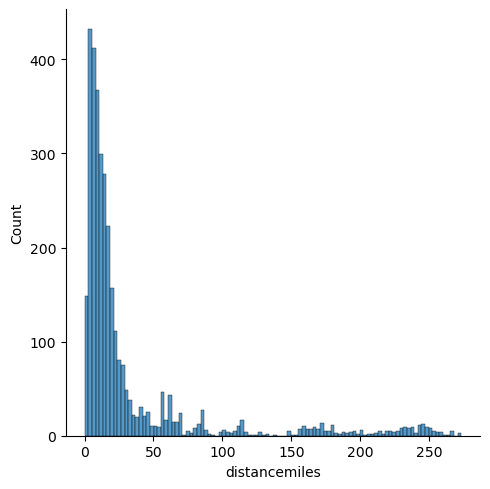

In [8]:
sns.displot(data = pitt_df, x = 'distancemiles', kind = 'hist')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


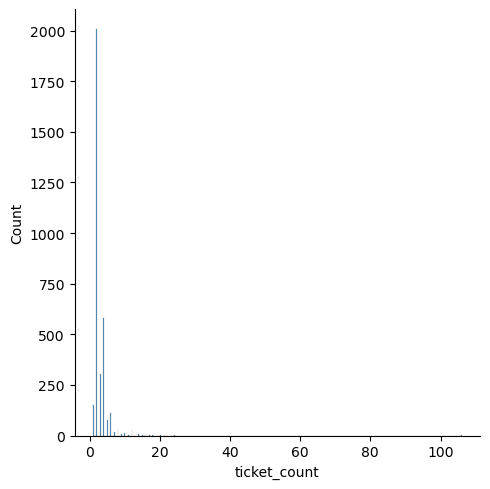

In [9]:
sns.displot(data = pitt_df, x = 'ticket_count', kind = 'hist')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


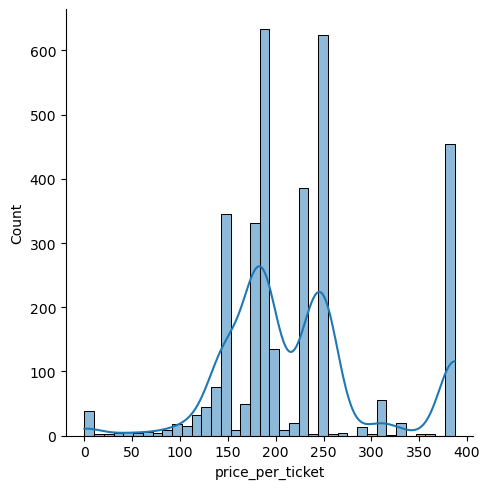

In [10]:
sns.displot(data = pitt_df, x = 'price_per_ticket', kind = 'hist', kde = True)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


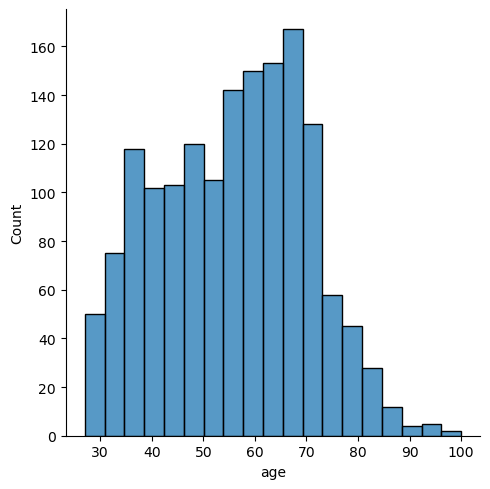

In [11]:
sns.displot(data = pitt_df, x = 'age', kind = 'hist')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


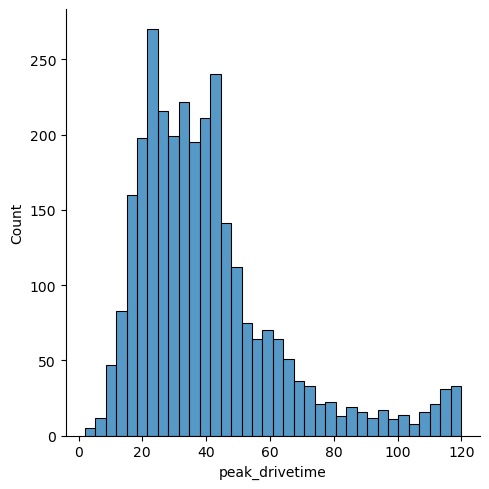

In [12]:
sns.displot(data = pitt_df, x = 'peak_drivetime', kind = 'hist')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


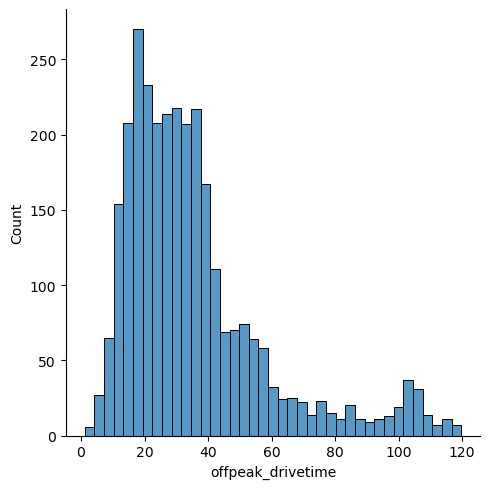

In [13]:
sns.displot(data = pitt_df, x = 'offpeak_drivetime', kind = 'hist')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


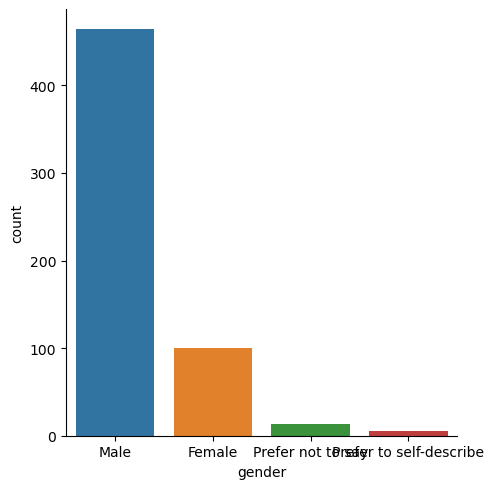

In [14]:
sns.catplot(data = pitt_df, x = 'gender', kind = 'count')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


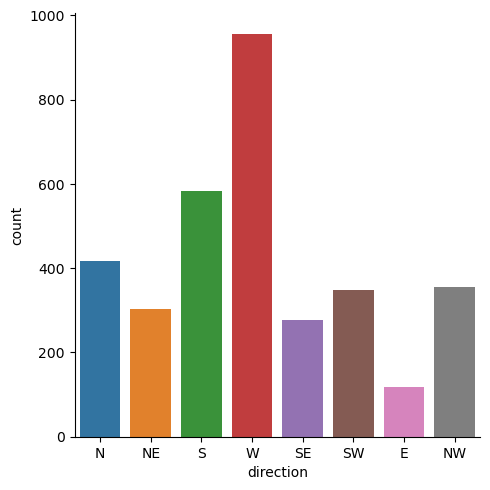

In [15]:
sns.catplot(data = pitt_df, x = 'direction', kind = 'count')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


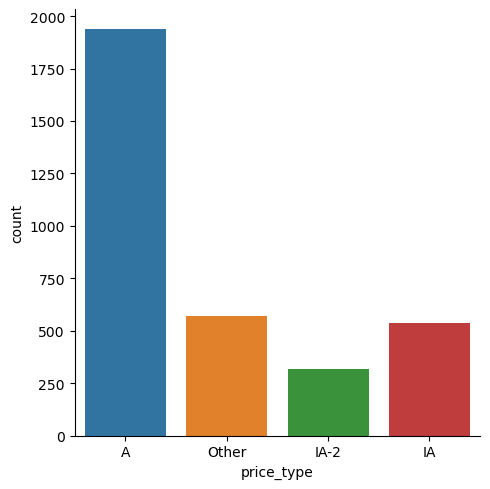

In [16]:
sns.catplot(data = pitt_df, x = 'price_type', kind = 'count')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


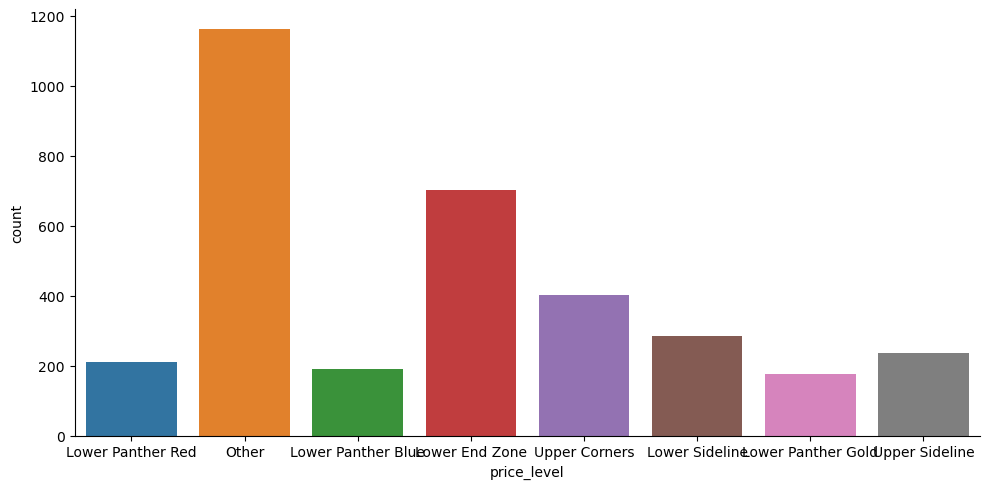

In [17]:
sns.catplot(data = pitt_df, x = 'price_level', kind = 'count', aspect=2 )

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


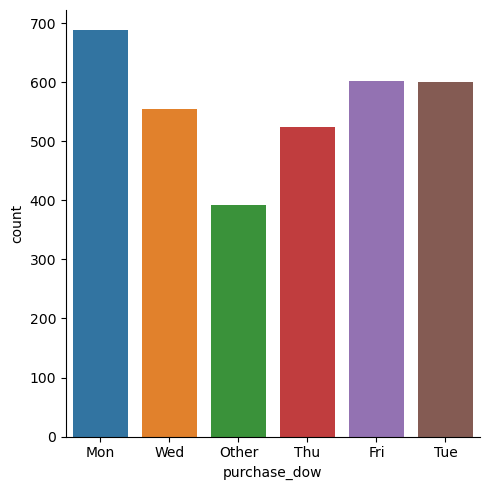

In [18]:
sns.catplot(data = pitt_df, x = 'purchase_dow', kind = 'count')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


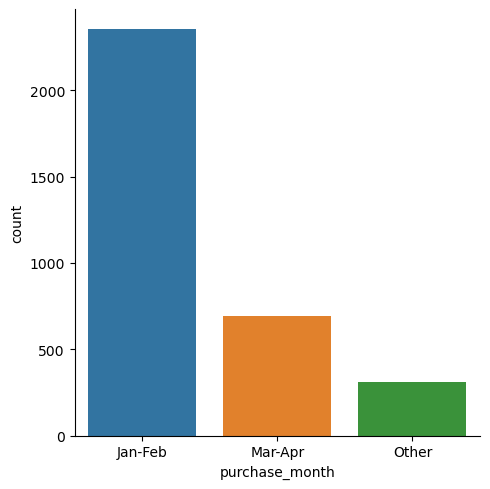

In [19]:
sns.catplot(data = pitt_df, x = 'purchase_month', kind = 'count')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


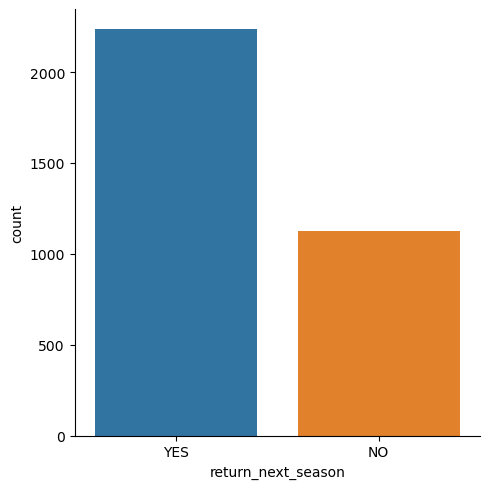

In [20]:
sns.catplot(data = pitt_df, x = 'return_next_season', kind = 'count')

plt.show()

## Combinations

These would be the combinations needed to examine all combinations of 2 variables for Categorical to Categorical and Categorical to Continuous:

Categorical-to-Categorical
* gender - direction
* gender - purchase_month
* gender - purchase_dow
* gender - price_type
* gender - price_level
* gender - return_next_season
* direction - purchase_month
* direction - purchase_dow
* direction - price_type
* direction - price_level
* direction - return_next_season
* purchase_month - purchase_dow
* purchase_month - price_type
* purchase_month - price_level
* purchase_month - return_next_season
* purchase_dow - price_type
* purchase_dow - price_level
* purchase_dow - return_next_season
* price_type - price_level
* price_type - return_next_season
* price_level - return_next_season

Categorical-to-Continuous
* gender - age
* gender - distancemiles
* gender - peak_drivetime
* gender - offpeak_drivetime
* gender - ticket_count
* gender - price_per_ticket
* direction - age
* direction - distancemiles
* direction - peak_drivetime
* direction - offpeak_drivetime
* direction - ticket_count
* direction - price_per_ticket
* purchase_month - age
* purchase_month - distancemiles
* purchase_month - peak_drivetime
* purchase_month - offpeak_drivetime
* purchase_month - ticket_count
* purchase_month - price_per_ticket
* purchase_dow - age
* purchase_dow - distancemiles
* purchase_dow - peak_drivetime
* purchase_dow - offpeak_drivetime
* purchase_dow - ticket_count
* purchase_dow - price_per_ticket
* price_type - age
* price_type - distancemiles
* price_type - peak_drivetime
* price_type - offpeak_drivetime
* price_type - ticket_count
* price_type - price_per_ticket
* price_level - age
* price_level - distancemiles
* price_level - peak_drivetime
* price_level - offpeak_drivetime
* price_level - ticket_count
* price_level - price_per_ticket
* return_next_season - age
* return_next_season - distancemiles
* return_next_season - peak_drivetime
* return_next_season - offpeak_drivetime
* return_next_season - ticket_count
* return_next_season - price_per_ticket

The pair plot below show all of the different comparisons between the continuous variables that would be used in the model if unaltered.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


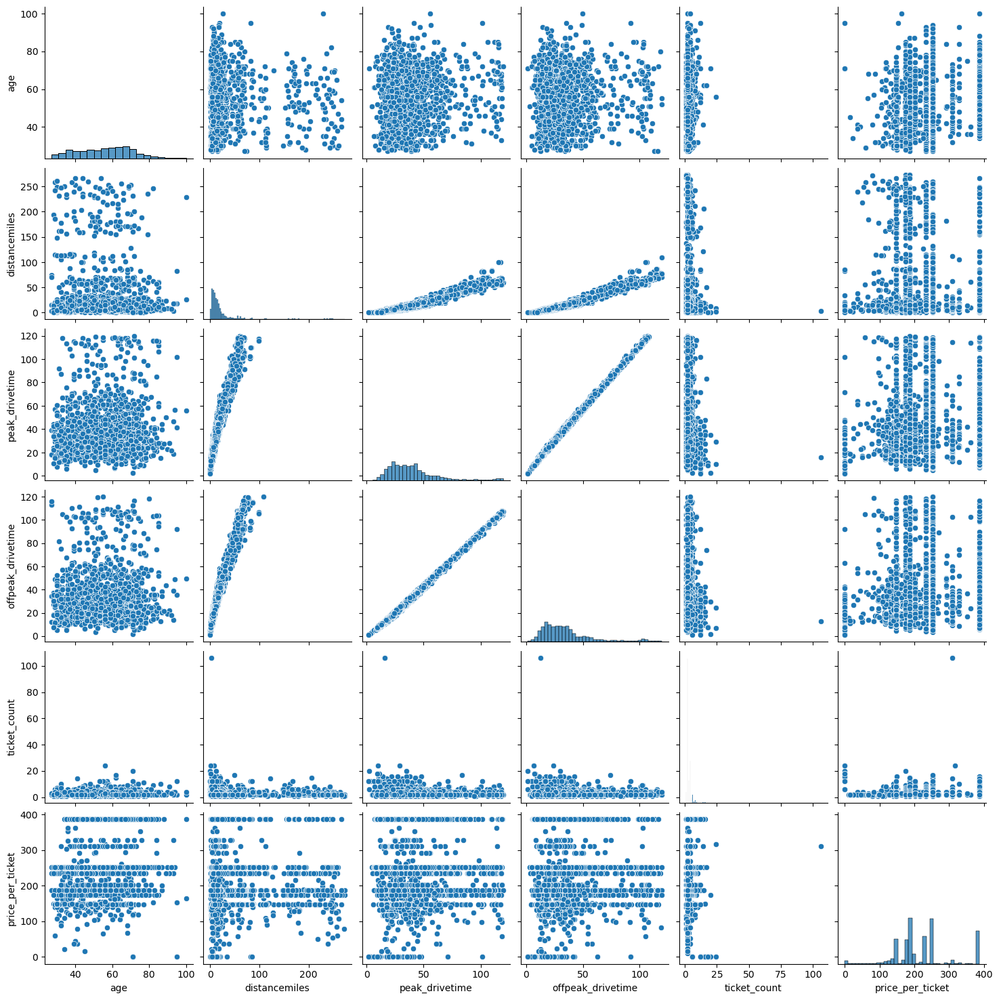

In [21]:
sns.pairplot(data= pitt_df, vars=['age', 'distancemiles', 'peak_drivetime', 'offpeak_drivetime', 'ticket_count', 'price_per_ticket'])

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


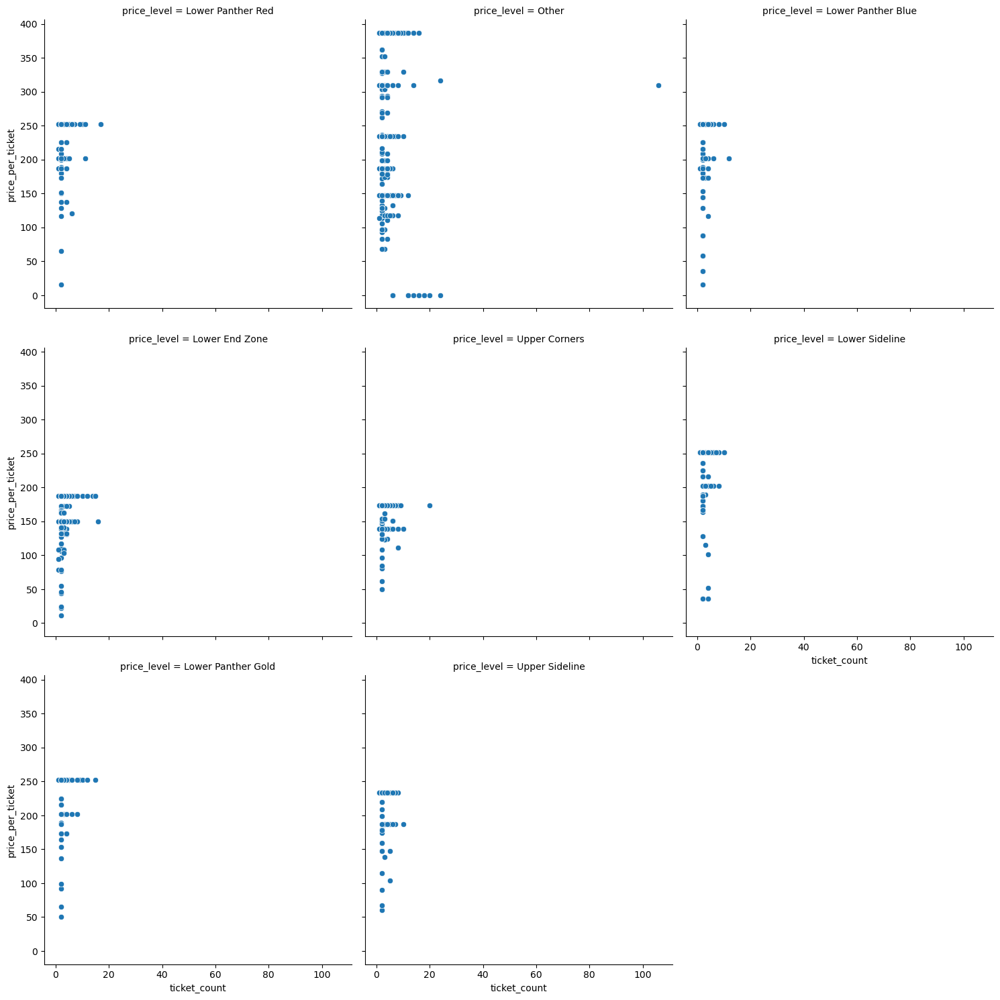

In [22]:
sns.relplot(data =pitt_df, x = 'ticket_count', y = 'price_per_ticket', col = 'price_level', kind = 'scatter', col_wrap=3)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


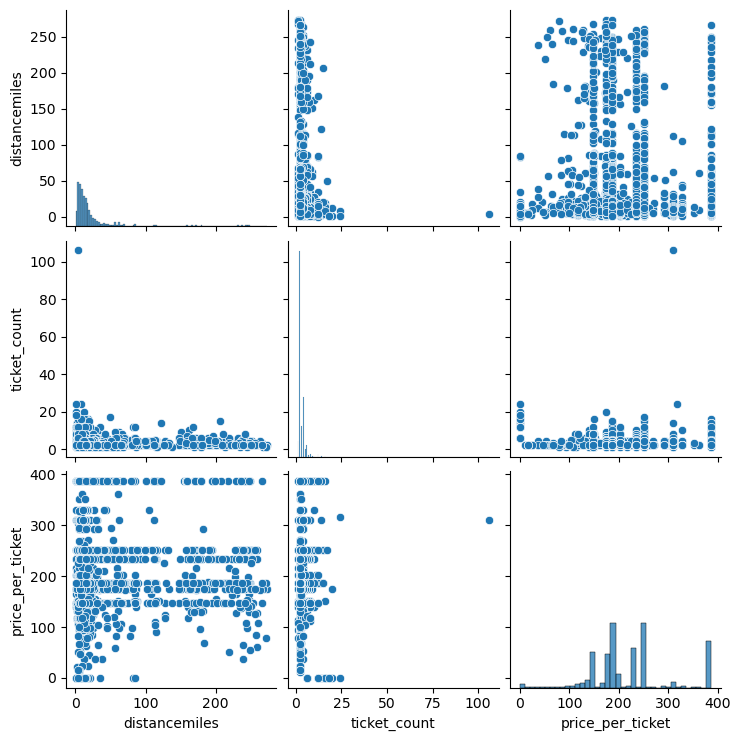

In [23]:
sns.pairplot(data= pitt_df, vars=['distancemiles', 'ticket_count', 'price_per_ticket'])

plt.show()

the above pairsplot shows the relationships between the continuous variables that will stay continuous/be used in the analysis as I am planning to run it

## Categorical to Continuous

Not all 42 possible comibinations will be helpful to view, so a select number of relationships will be shown below

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


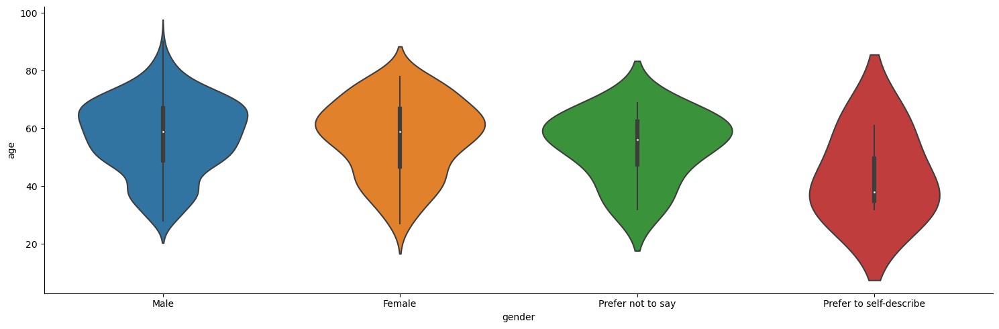

In [24]:
sns.catplot(data = pitt_df, x = 'gender', y = 'age', kind = 'violin', aspect = 3 )

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


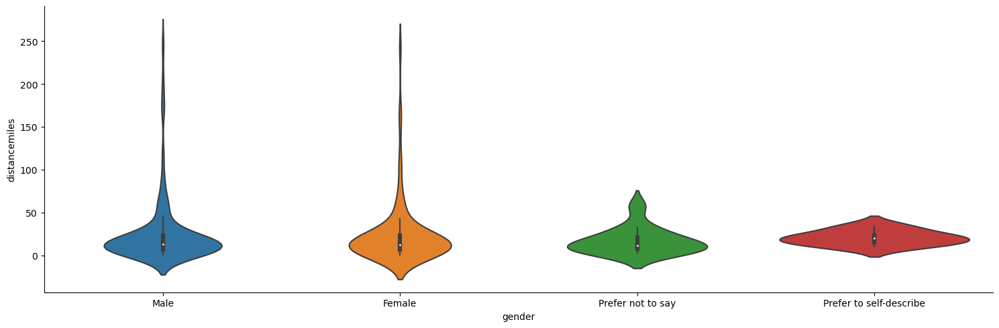

In [25]:
sns.catplot(data = pitt_df, x = 'gender', y = 'distancemiles', kind = 'violin', aspect = 3 )

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


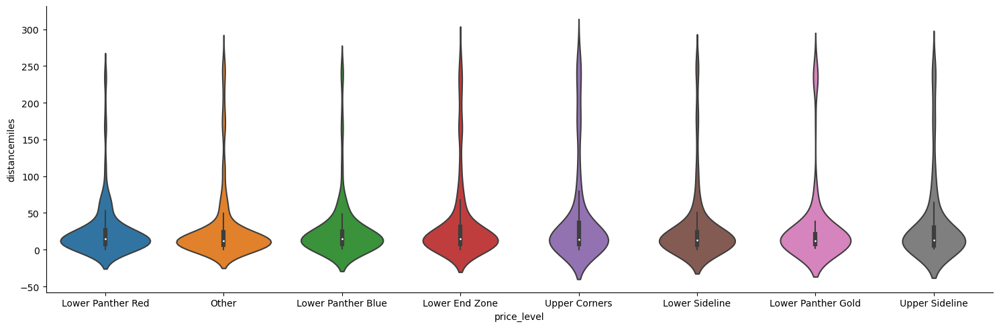

In [26]:
sns.catplot(data = pitt_df, x = 'price_level', y = 'distancemiles', kind = 'violin', aspect = 3 )

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


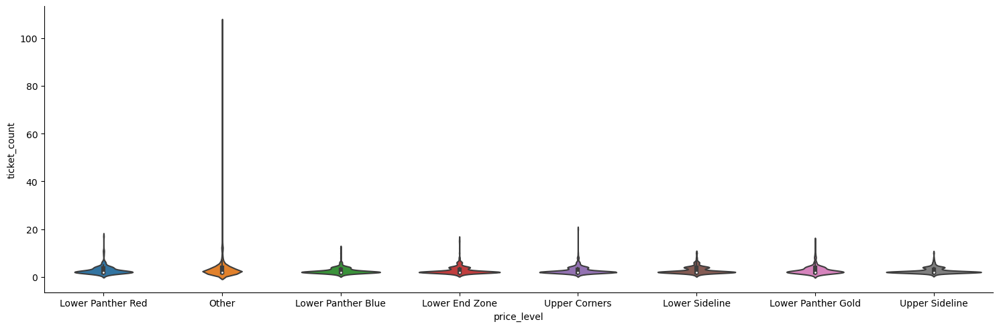

In [27]:
sns.catplot(data = pitt_df, x = 'price_level', y = 'ticket_count', kind = 'violin', aspect = 3 )

plt.show()

## Further Exploration

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


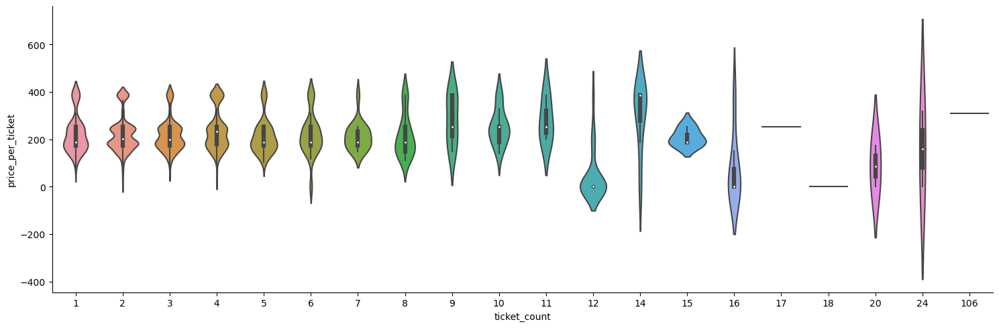

In [28]:
sns.catplot(data =pitt_df, x = 'ticket_count', y = 'price_per_ticket', kind = 'violin', aspect = 3)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


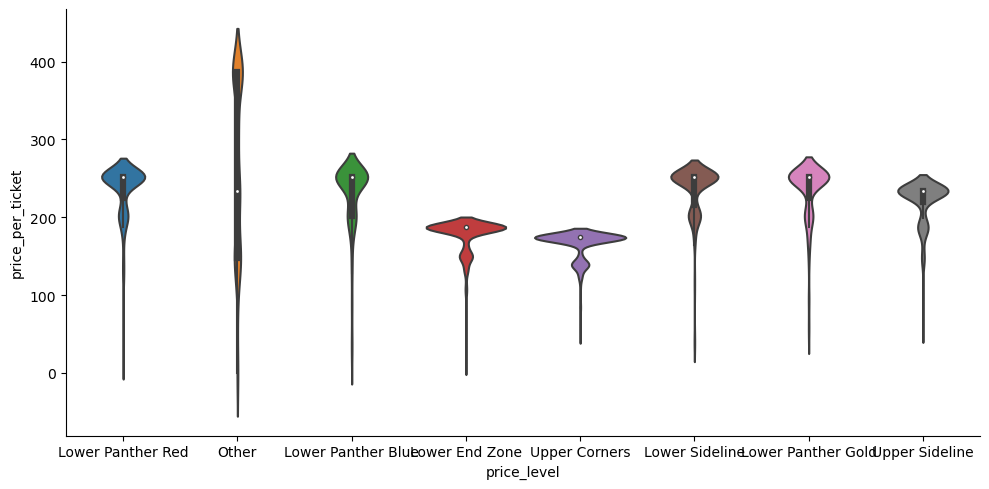

In [29]:
sns.catplot(data =pitt_df, x = 'price_level', y = 'price_per_ticket', kind = 'violin', aspect=2)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


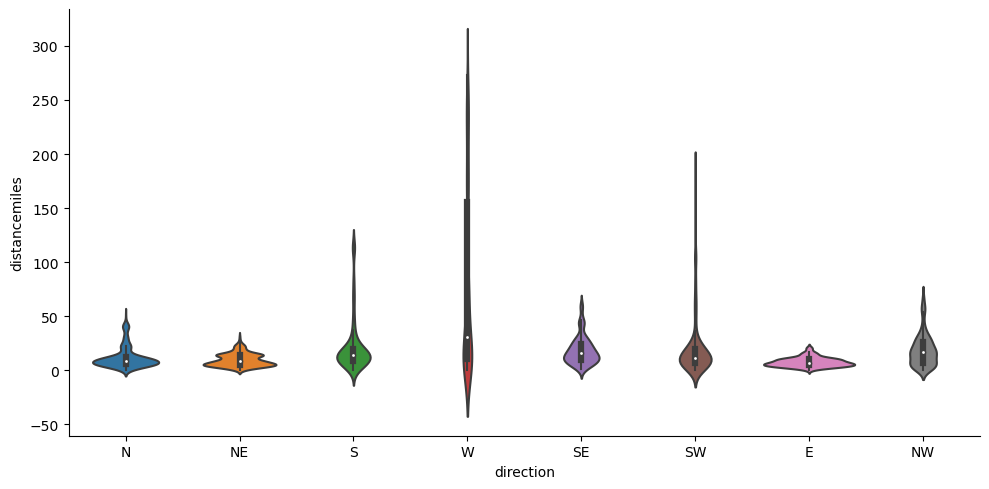

In [30]:
sns.catplot(data =pitt_df, x = 'direction', y = 'distancemiles', kind = 'violin', aspect=2)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


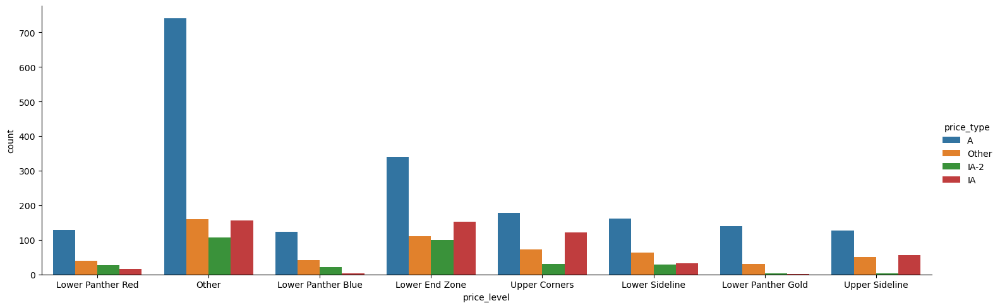

In [31]:
sns.catplot(data = pitt_df, x = 'price_level', hue = 'price_type', kind = 'count', aspect=3)

plt.show()

In [32]:
pitt_df.accountid = pitt_df.accountid.astype('str')

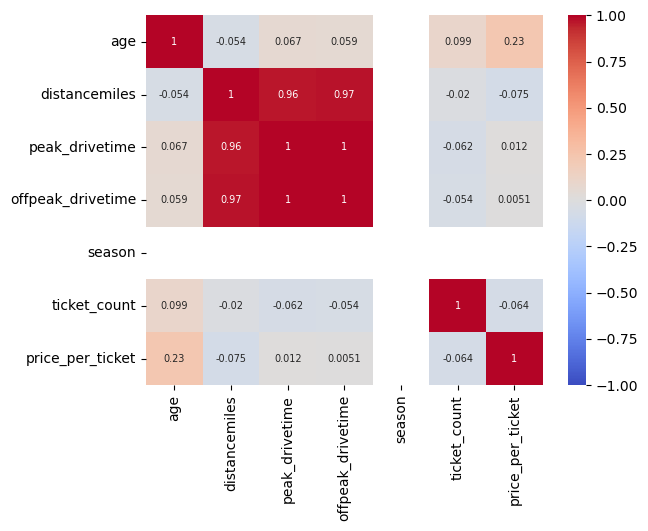

In [33]:
fig, ax = plt.subplots()

sns.heatmap(data = pitt_df.corr(numeric_only=True),
            vmin=-1, vmax=1, center=0,
            annot=True, annot_kws={'fontsize': 7},
             cmap='coolwarm',
            ax=ax)

plt.show()

## Groups

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


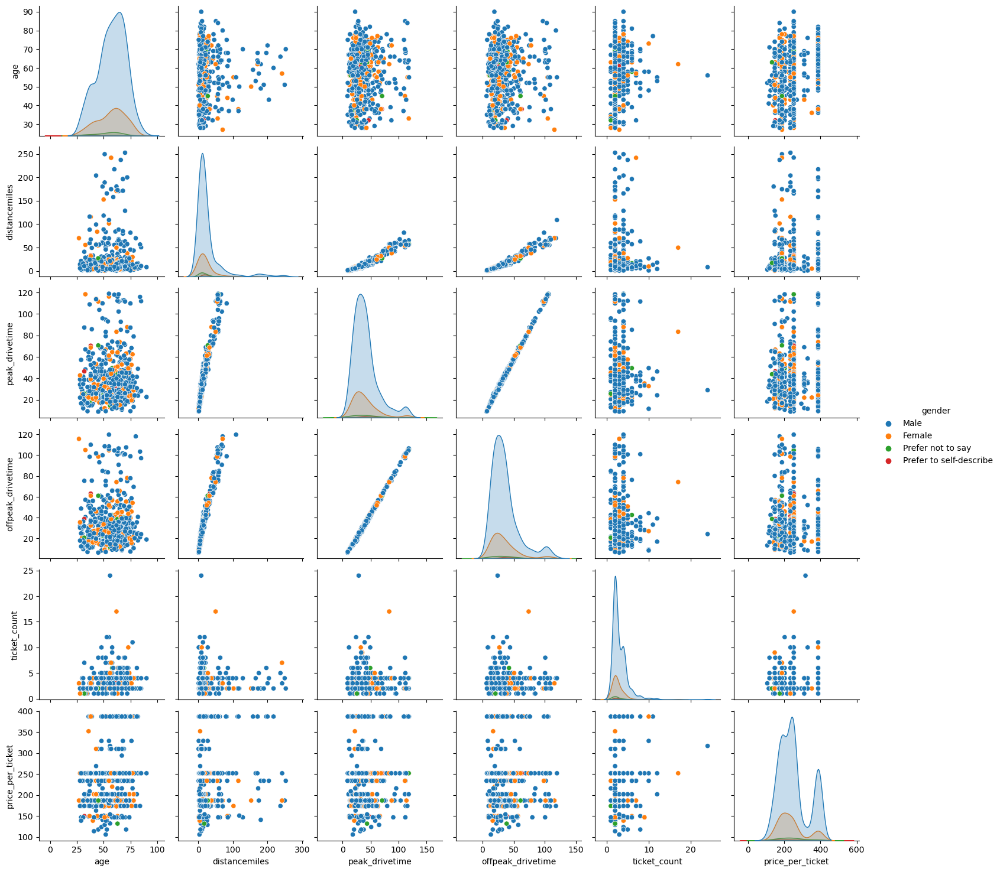

In [34]:
sns.pairplot(data= pitt_df, vars=['age', 'distancemiles', 'peak_drivetime', 'offpeak_drivetime', 'ticket_count', 'price_per_ticket'], hue='gender')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


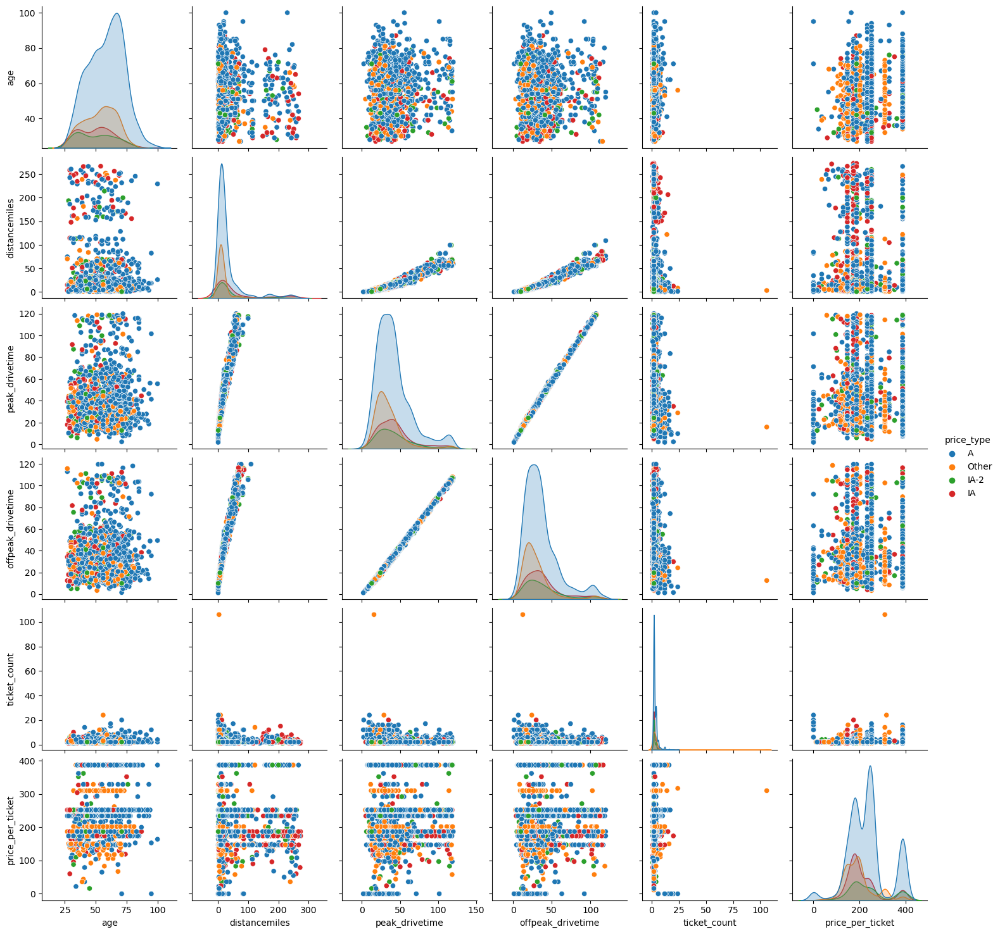

In [35]:
sns.pairplot(data= pitt_df, vars=['age', 'distancemiles', 'peak_drivetime', 'offpeak_drivetime', 'ticket_count', 'price_per_ticket'], hue='price_type')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


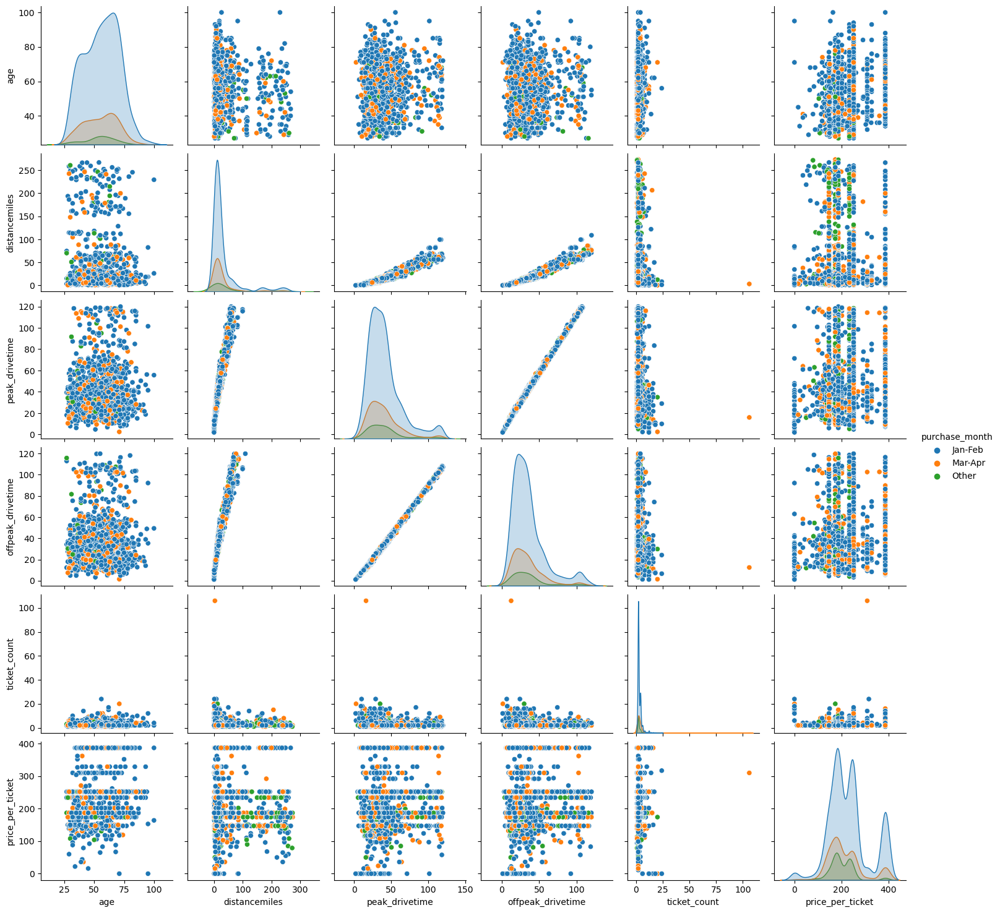

In [36]:
sns.pairplot(data= pitt_df, vars=['age', 'distancemiles', 'peak_drivetime', 'offpeak_drivetime', 'ticket_count', 'price_per_ticket'], hue='purchase_month')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


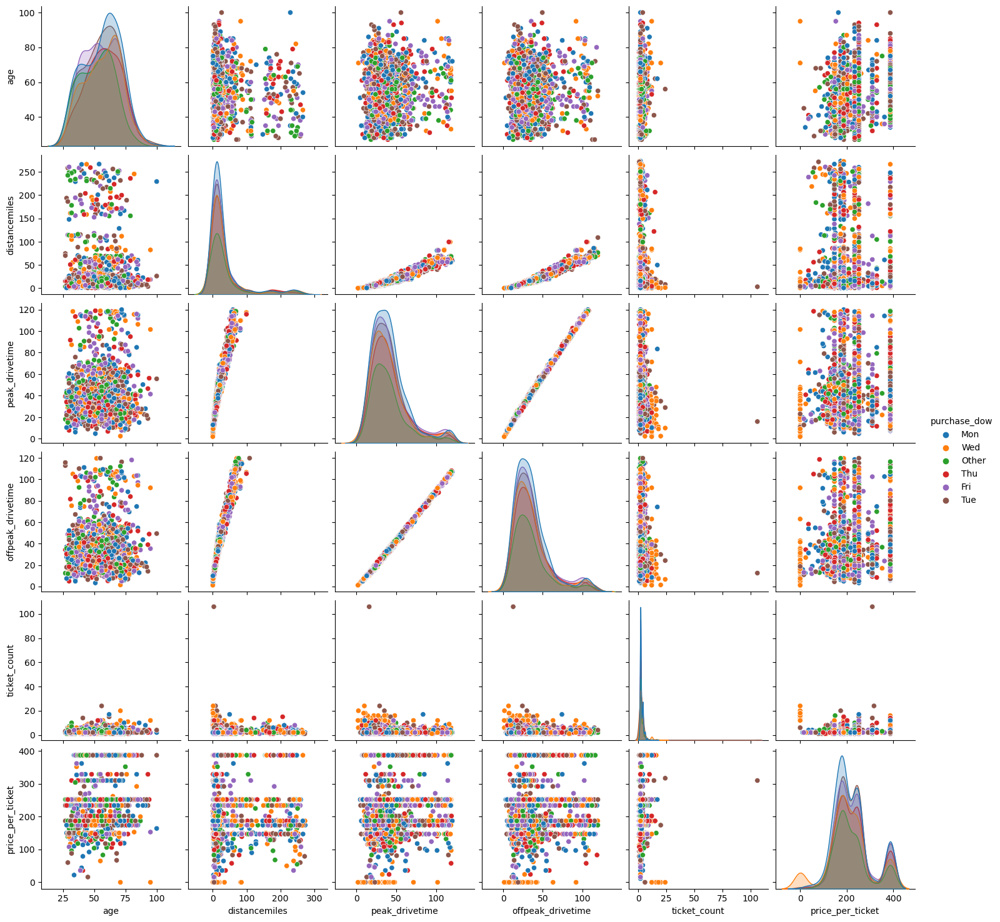

In [37]:
sns.pairplot(data= pitt_df, vars=['age', 'distancemiles', 'peak_drivetime', 'offpeak_drivetime', 'ticket_count', 'price_per_ticket'], hue='purchase_dow')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


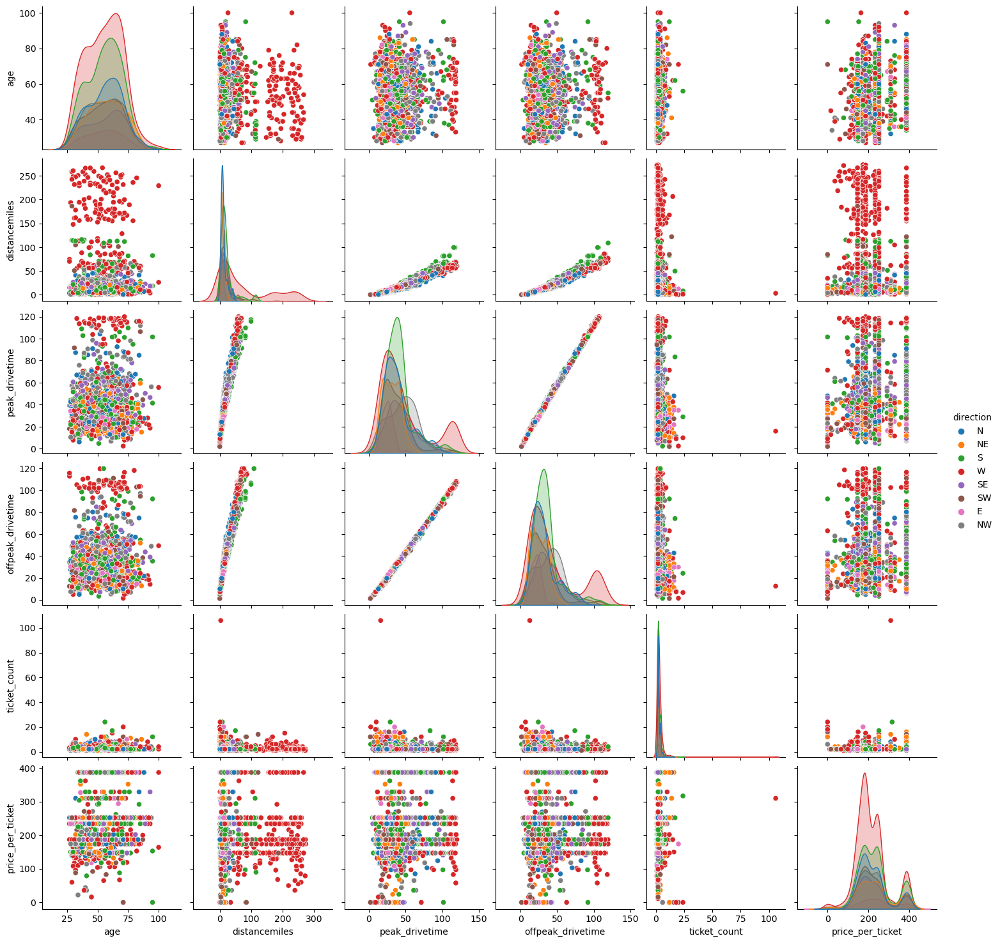

In [38]:
sns.pairplot(data= pitt_df, vars=['age', 'distancemiles', 'peak_drivetime', 'offpeak_drivetime', 'ticket_count', 'price_per_ticket'], hue='direction')

plt.show()

## Response Stats

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


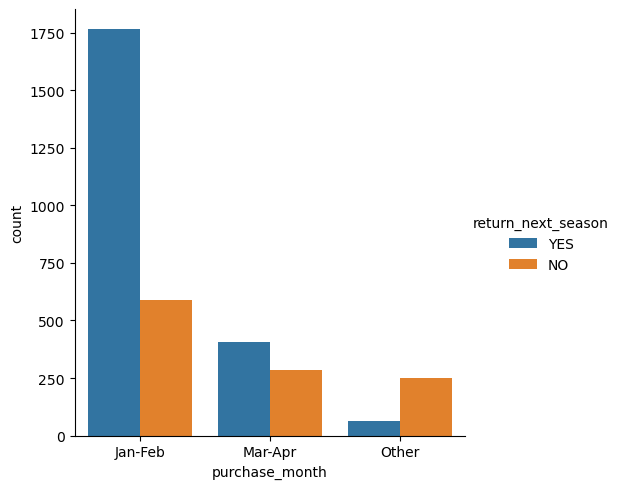

In [39]:
sns.catplot(data = pitt_df, x = 'purchase_month', kind = 'count', hue = 'return_next_season')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


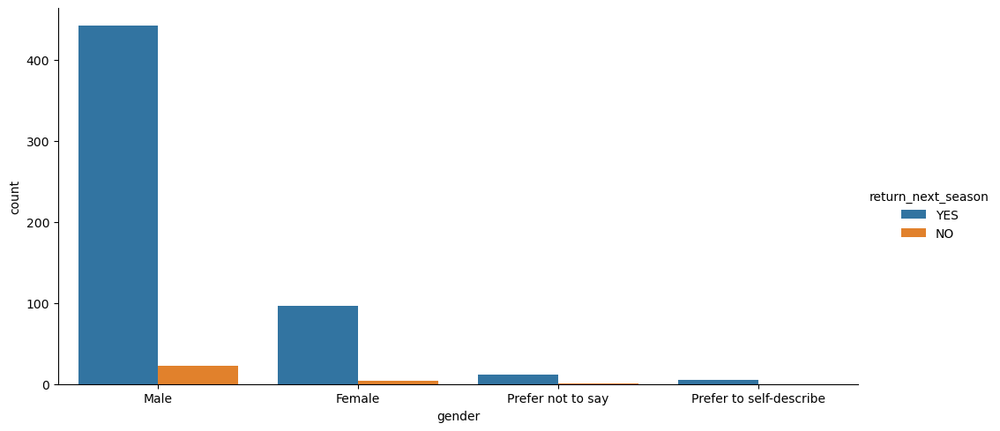

In [40]:
sns.catplot(data = pitt_df, x = 'gender', kind = 'count', hue = 'return_next_season', aspect = 2)
### Note that this does not account for the missings as that has not been done in the data exploration and will be done in modeling
plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


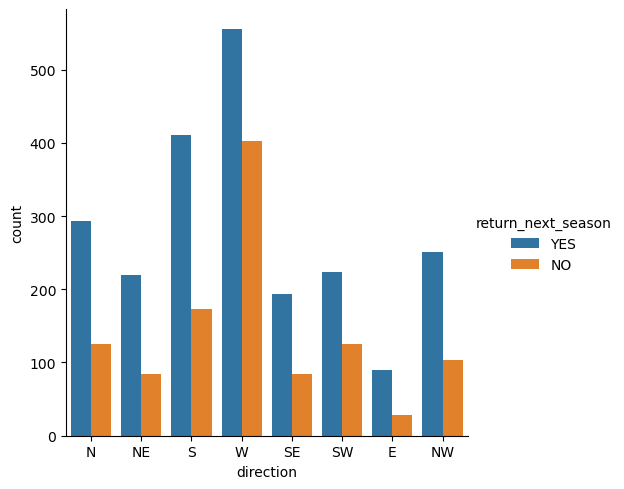

In [41]:
sns.catplot(data = pitt_df, x = 'direction', kind = 'count', hue = 'return_next_season')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


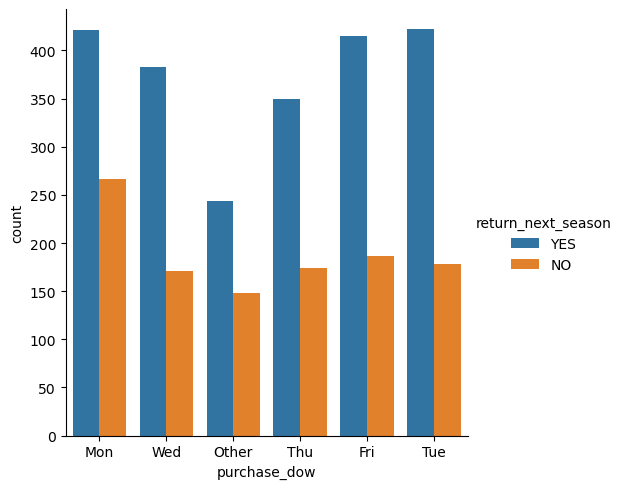

In [42]:
sns.catplot(data = pitt_df, x = 'purchase_dow', kind = 'count', hue = 'return_next_season')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


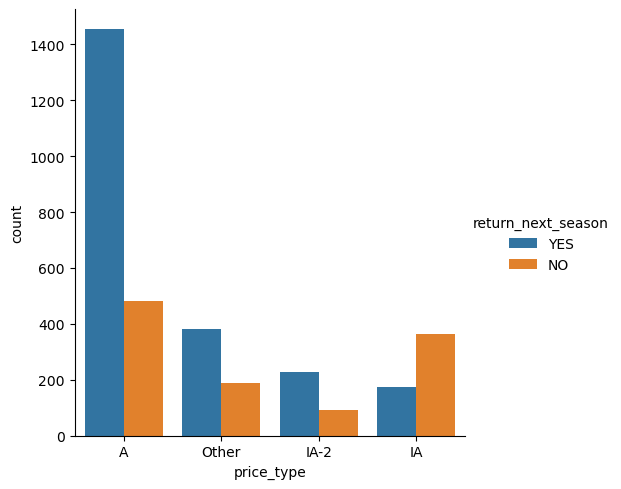

In [43]:
sns.catplot(data = pitt_df, x = 'price_type', kind = 'count', hue = 'return_next_season')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


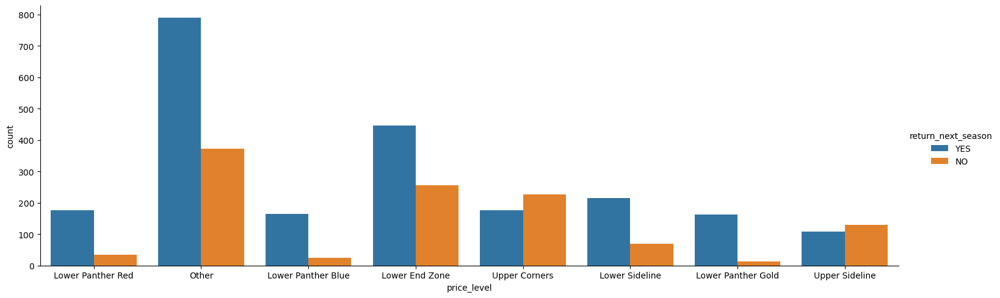

In [44]:
sns.catplot(data = pitt_df, x = 'price_level', kind = 'count', hue = 'return_next_season', aspect=3)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


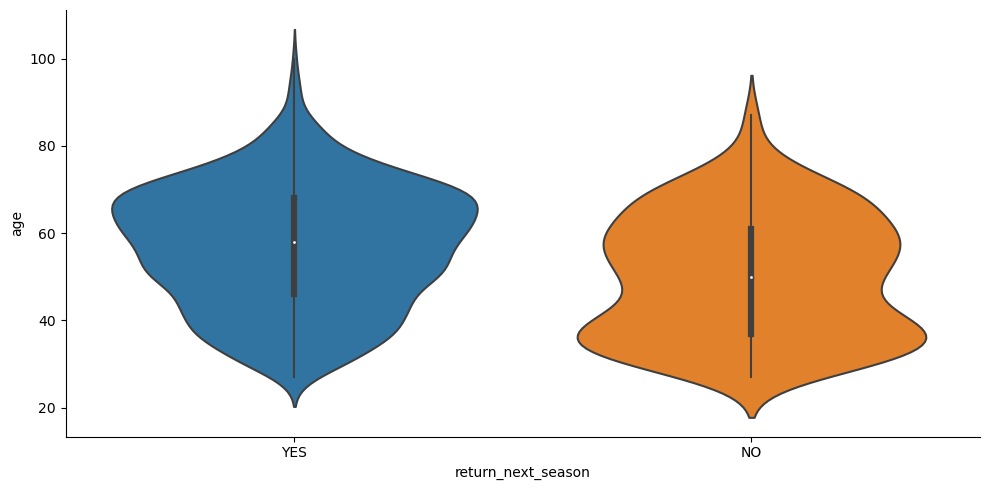

In [45]:
sns.catplot(data = pitt_df, x = 'return_next_season', y = 'age', kind = 'violin', aspect = 2
        )

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


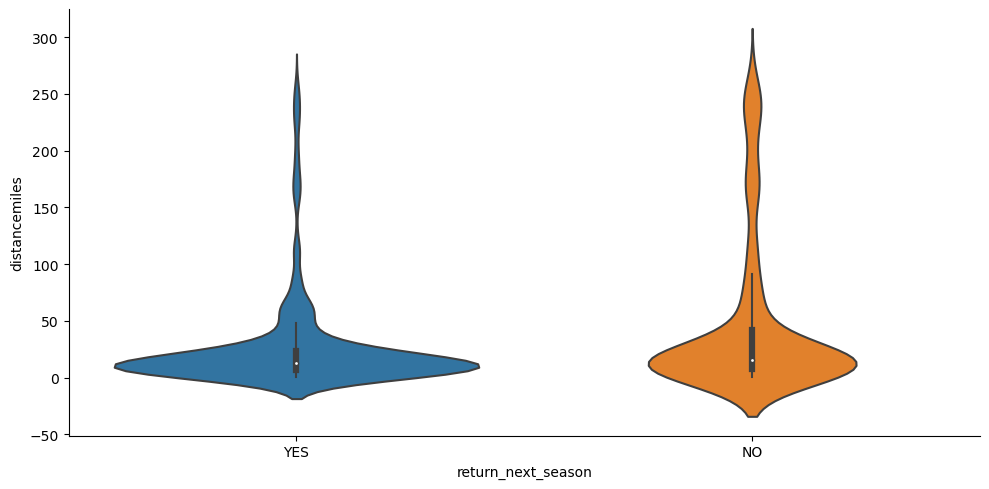

In [46]:
sns.catplot(data = pitt_df, x = 'return_next_season', y = 'distancemiles', kind = 'violin', aspect = 2)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


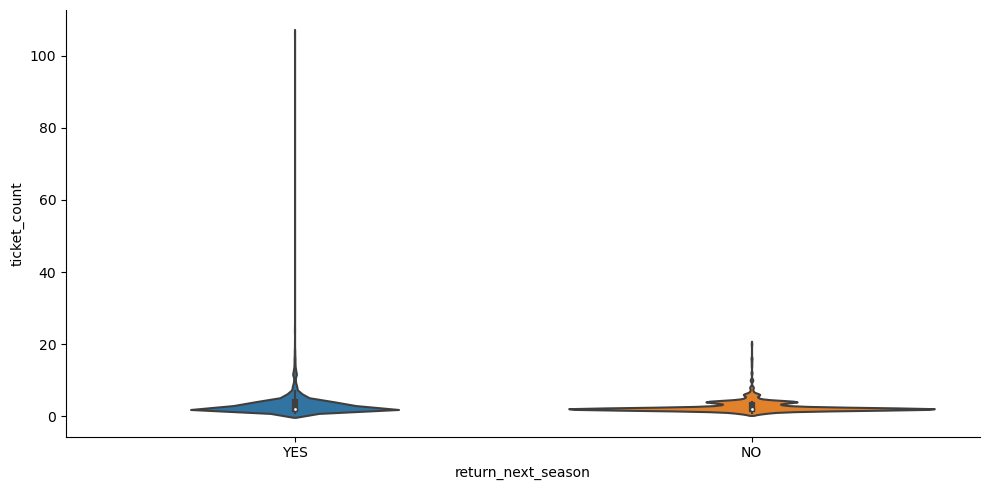

In [47]:
sns.catplot(data = pitt_df, x = 'return_next_season', y = 'ticket_count', kind = 'violin', aspect = 2 )

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


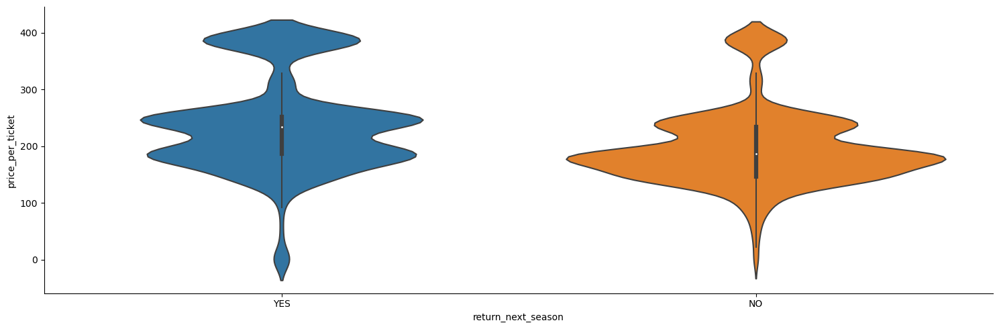

In [48]:
sns.catplot(data = pitt_df, x = 'return_next_season', y = 'price_per_ticket', kind = 'violin', aspect = 3 )

plt.show()

## Cluster

In [49]:
from sklearn.cluster import KMeans

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


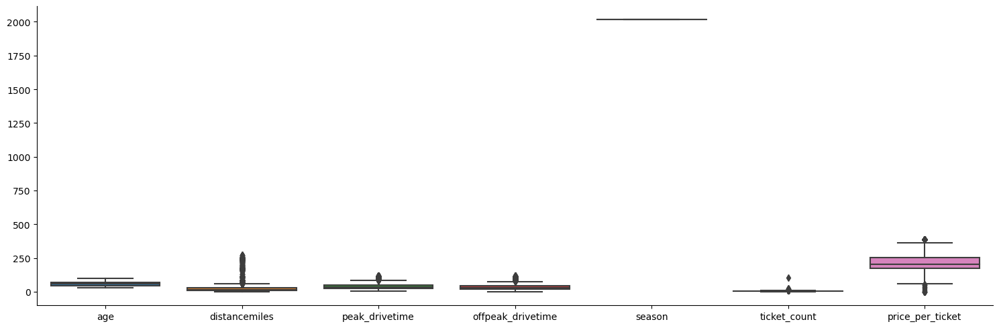

In [50]:
sns.catplot(data = pitt_df, kind = 'box', aspect = 3)

plt.show()

This box plot shows both the need to remove the categories that we will be treating as categorical (`season` and `accountid`) but also the need to scale. First we will remove the missings to only get complete cases. For this proposal, we will do this by dropping all rows with any missing values. 

Before we do anything we will make a working copy of the dataframe to make our changes to

In [51]:
df_clean = pitt_df.copy()

In [52]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3360 entries, 0 to 3359
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   accountid           3360 non-null   object 
 1   age                 1567 non-null   float64
 2   gender              582 non-null    object 
 3   distancemiles       3360 non-null   float64
 4   direction           3360 non-null   object 
 5   peak_drivetime      2958 non-null   float64
 6   offpeak_drivetime   2996 non-null   float64
 7   season              3360 non-null   int64  
 8   purchase_month      3360 non-null   object 
 9   purchase_dow        3360 non-null   object 
 10  price_type          3360 non-null   object 
 11  price_level         3360 non-null   object 
 12  ticket_count        3360 non-null   int64  
 13  price_per_ticket    3360 non-null   float64
 14  return_next_season  3360 non-null   object 
dtypes: float64(5), int64(2), object(8)
memory usage: 393.9+

Now that we have our copy to work off of, we will deal with the missings

In [53]:
df_clean.gender.fillna(value='(MISSING)', inplace=True)

In [54]:
df_clean.gender.info()

<class 'pandas.core.series.Series'>
RangeIndex: 3360 entries, 0 to 3359
Series name: gender
Non-Null Count  Dtype 
--------------  ----- 
3360 non-null   object
dtypes: object(1)
memory usage: 26.4+ KB


In [55]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3360 entries, 0 to 3359
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   accountid           3360 non-null   object 
 1   age                 1567 non-null   float64
 2   gender              3360 non-null   object 
 3   distancemiles       3360 non-null   float64
 4   direction           3360 non-null   object 
 5   peak_drivetime      2958 non-null   float64
 6   offpeak_drivetime   2996 non-null   float64
 7   season              3360 non-null   int64  
 8   purchase_month      3360 non-null   object 
 9   purchase_dow        3360 non-null   object 
 10  price_type          3360 non-null   object 
 11  price_level         3360 non-null   object 
 12  ticket_count        3360 non-null   int64  
 13  price_per_ticket    3360 non-null   float64
 14  return_next_season  3360 non-null   object 
dtypes: float64(5), int64(2), object(8)
memory usage: 393.9+

For this proposal, we will drop all of the remaining missings

In [56]:
df_clean.dropna().info()

<class 'pandas.core.frame.DataFrame'>
Index: 1411 entries, 2 to 3359
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   accountid           1411 non-null   object 
 1   age                 1411 non-null   float64
 2   gender              1411 non-null   object 
 3   distancemiles       1411 non-null   float64
 4   direction           1411 non-null   object 
 5   peak_drivetime      1411 non-null   float64
 6   offpeak_drivetime   1411 non-null   float64
 7   season              1411 non-null   int64  
 8   purchase_month      1411 non-null   object 
 9   purchase_dow        1411 non-null   object 
 10  price_type          1411 non-null   object 
 11  price_level         1411 non-null   object 
 12  ticket_count        1411 non-null   int64  
 13  price_per_ticket    1411 non-null   float64
 14  return_next_season  1411 non-null   object 
dtypes: float64(5), int64(2), object(8)
memory usage: 176.4+ KB


As shown above this will leave us with 1411 cases with which we can run KMeans.

In [57]:
df_clean_NM = df_clean.dropna().copy()

In [58]:
df_clean_NM.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1411 entries, 2 to 3359
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   accountid           1411 non-null   object 
 1   age                 1411 non-null   float64
 2   gender              1411 non-null   object 
 3   distancemiles       1411 non-null   float64
 4   direction           1411 non-null   object 
 5   peak_drivetime      1411 non-null   float64
 6   offpeak_drivetime   1411 non-null   float64
 7   season              1411 non-null   int64  
 8   purchase_month      1411 non-null   object 
 9   purchase_dow        1411 non-null   object 
 10  price_type          1411 non-null   object 
 11  price_level         1411 non-null   object 
 12  ticket_count        1411 non-null   int64  
 13  price_per_ticket    1411 non-null   float64
 14  return_next_season  1411 non-null   object 
dtypes: float64(5), int64(2), object(8)
memory usage: 176.4+ KB


In [59]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3360 entries, 0 to 3359
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   accountid           3360 non-null   object 
 1   age                 1567 non-null   float64
 2   gender              3360 non-null   object 
 3   distancemiles       3360 non-null   float64
 4   direction           3360 non-null   object 
 5   peak_drivetime      2958 non-null   float64
 6   offpeak_drivetime   2996 non-null   float64
 7   season              3360 non-null   int64  
 8   purchase_month      3360 non-null   object 
 9   purchase_dow        3360 non-null   object 
 10  price_type          3360 non-null   object 
 11  price_level         3360 non-null   object 
 12  ticket_count        3360 non-null   int64  
 13  price_per_ticket    3360 non-null   float64
 14  return_next_season  3360 non-null   object 
dtypes: float64(5), int64(2), object(8)
memory usage: 393.9+

In [60]:
from sklearn.preprocessing import StandardScaler

In [61]:
pitt_numbers = df_clean_NM.select_dtypes('number').copy()

In [62]:
X = StandardScaler().fit_transform(pitt_numbers)

In [63]:
X.shape

(1411, 7)

In [64]:
pitt_numbers.shape

(1411, 7)

Now we'll make a new dataframe with the clean, scaled values

In [65]:
Pitt_KM = pd.DataFrame(X, columns=pitt_numbers.columns)

In [66]:
Pitt_KM.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1411 entries, 0 to 1410
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   age                1411 non-null   float64
 1   distancemiles      1411 non-null   float64
 2   peak_drivetime     1411 non-null   float64
 3   offpeak_drivetime  1411 non-null   float64
 4   season             1411 non-null   float64
 5   ticket_count       1411 non-null   float64
 6   price_per_ticket   1411 non-null   float64
dtypes: float64(7)
memory usage: 77.3 KB


### Clustering

For this clustering we are using the **continuous** inputs

In [67]:
pitt_clusters_2 = KMeans(n_clusters=2, random_state=121, n_init=25, max_iter=500).fit_predict(X)

In [68]:
df_clean_NM_copy = df_clean_NM.copy()

In [69]:
df_clean_NM_copy['k2'] = pd.Series(pitt_clusters_2, index = df_clean_NM_copy.index).astype('category')

In [70]:
df_clean_NM_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1411 entries, 2 to 3359
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   accountid           1411 non-null   object  
 1   age                 1411 non-null   float64 
 2   gender              1411 non-null   object  
 3   distancemiles       1411 non-null   float64 
 4   direction           1411 non-null   object  
 5   peak_drivetime      1411 non-null   float64 
 6   offpeak_drivetime   1411 non-null   float64 
 7   season              1411 non-null   int64   
 8   purchase_month      1411 non-null   object  
 9   purchase_dow        1411 non-null   object  
 10  price_type          1411 non-null   object  
 11  price_level         1411 non-null   object  
 12  ticket_count        1411 non-null   int64   
 13  price_per_ticket    1411 non-null   float64 
 14  return_next_season  1411 non-null   object  
 15  k2                  1411 non-null   categor

In [71]:
df_clean_NM_copy.k2.value_counts()

k2
0    1203
1     208
Name: count, dtype: int64

By looking at the values counts of this clustering, we can see that the counts are VERY heavily skewed toward group 0 with over 1200 cases appearing in said cluster

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


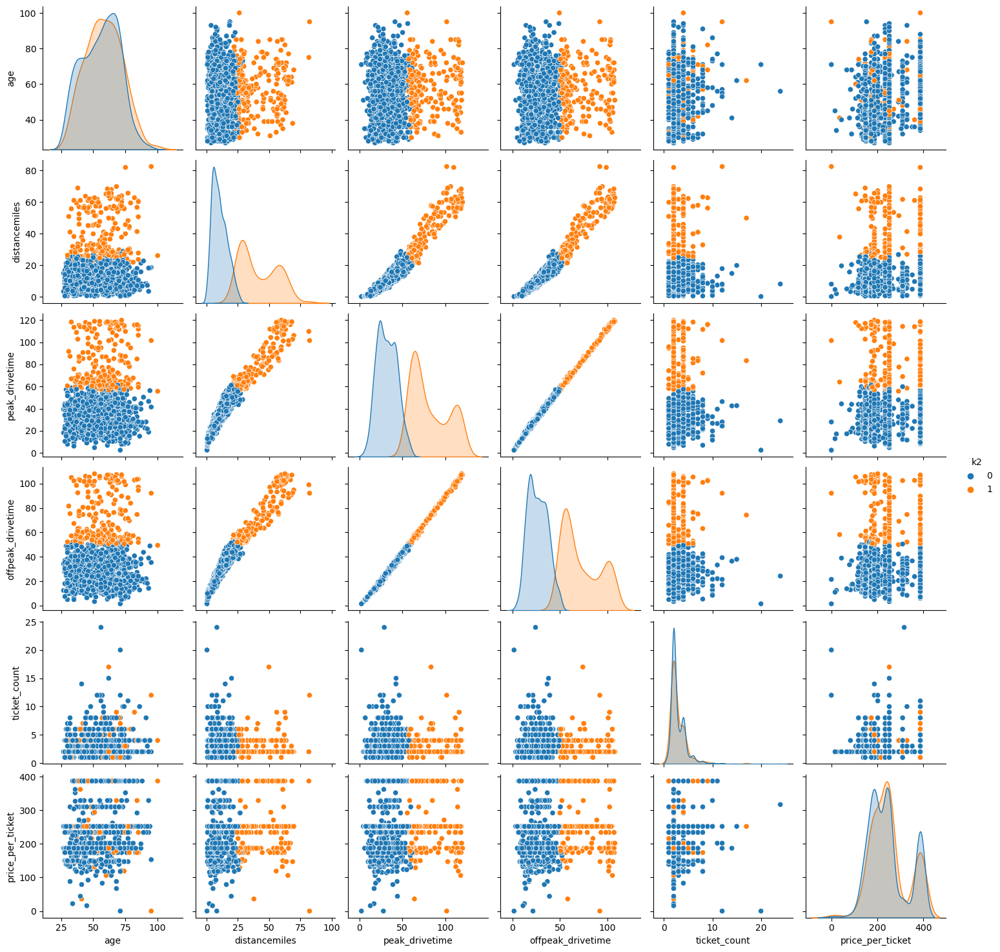

In [72]:
sns.pairplot(data = df_clean_NM_copy, hue = 'k2',vars=['age', 'distancemiles', 'peak_drivetime', 'offpeak_drivetime', 'ticket_count', 'price_per_ticket'],diag_kws={'common_norm':False})

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


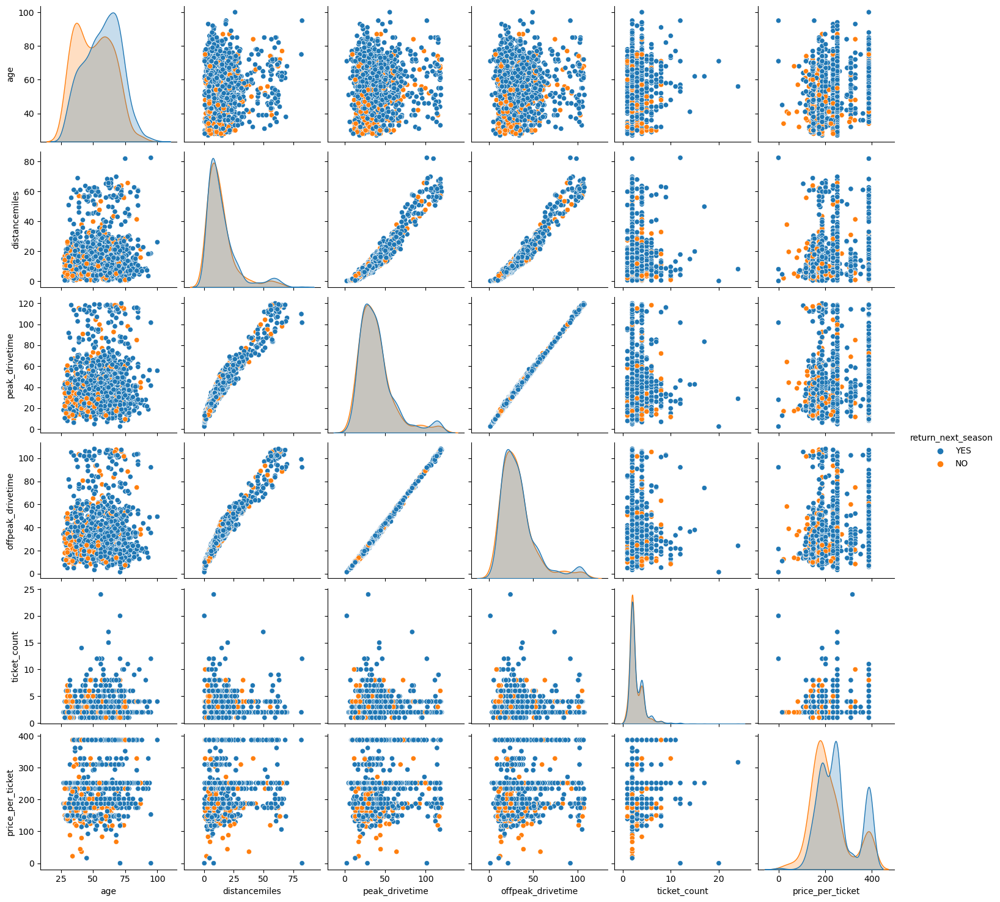

In [73]:
### Changing the hue to return_next_season
sns.pairplot(data = df_clean_NM_copy, hue = 'return_next_season',vars=['age', 'distancemiles', 'peak_drivetime', 'offpeak_drivetime', 'ticket_count', 'price_per_ticket'],diag_kws={'common_norm':False})

plt.show()

From this we can see that 2 clusters doesn't necesarrily show interesting behavior OR match up with the `return_next_season` variable

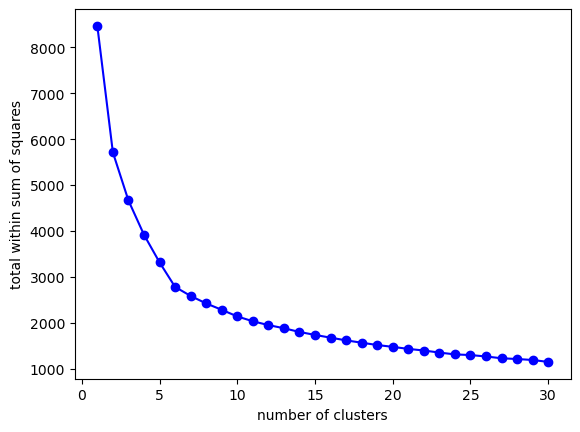

In [74]:
tots_within = []

K = range(1, 31)

for k in K:
    km = KMeans(n_clusters=k, random_state=121, n_init=25, max_iter=500)
    km = km.fit( X )
    
    tots_within.append( km.inertia_ )

fig, ax = plt.subplots()

ax.plot( K, tots_within, 'bo-' )
ax.set_xlabel('number of clusters')
ax.set_ylabel('total within sum of squares')

plt.show()

From this knee-bend plot, it looks like 6 clusters should give us intereseting results

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


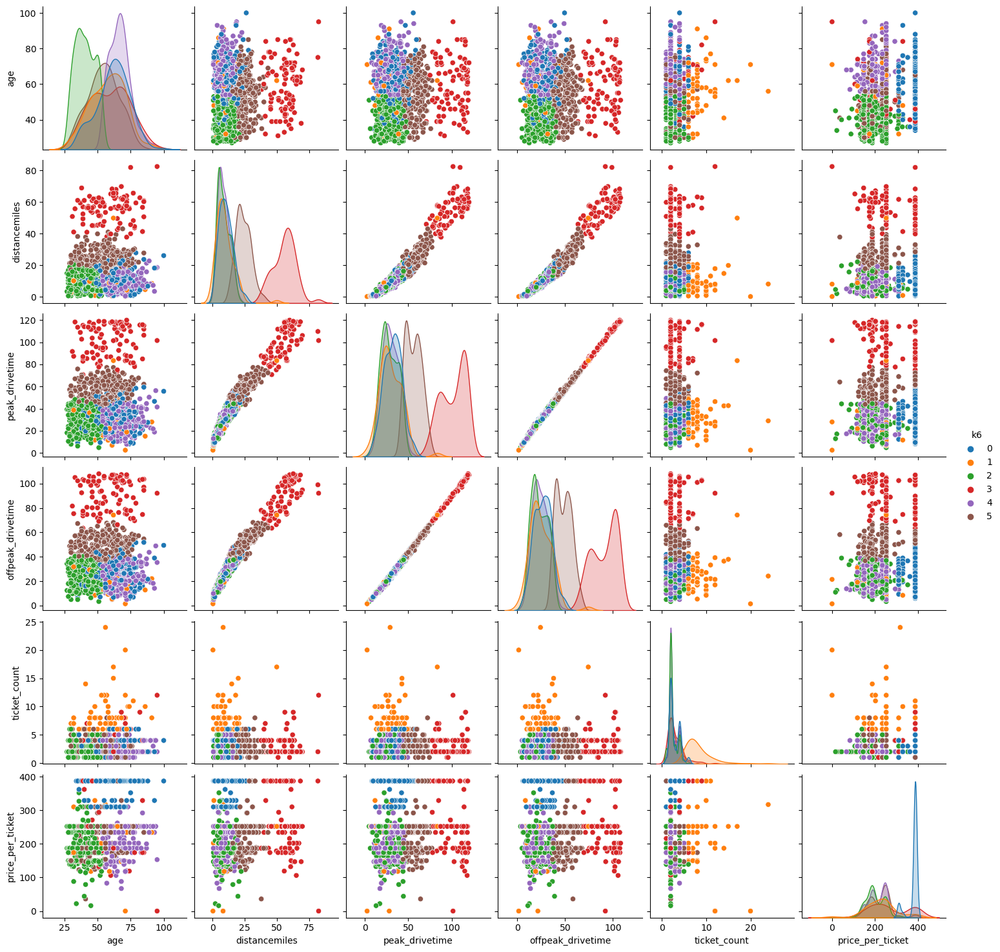

In [75]:
pitt_clusters_6 = KMeans(n_clusters=6, random_state=121, n_init=25, max_iter=500).fit_predict(X)
df_clean_NM_copy['k6'] = pd.Series(pitt_clusters_6, index = df_clean_NM_copy.index).astype('category')

sns.pairplot(data = df_clean_NM_copy, hue = 'k6', vars=['age', 'distancemiles', 'peak_drivetime', 'offpeak_drivetime', 'ticket_count', 'price_per_ticket'],diag_kws={'common_norm':False})

plt.show()

## PCA 

In [76]:
from sklearn.decomposition import PCA

In [77]:
pca_pitt = PCA(n_components=2).fit_transform(X)

In [78]:
pca_pitt_df = pd.DataFrame(pca_pitt, columns=['pc01', 'pc02'])

pca_pitt_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1411 entries, 0 to 1410
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   pc01    1411 non-null   float64
 1   pc02    1411 non-null   float64
dtypes: float64(2)
memory usage: 22.2 KB


/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


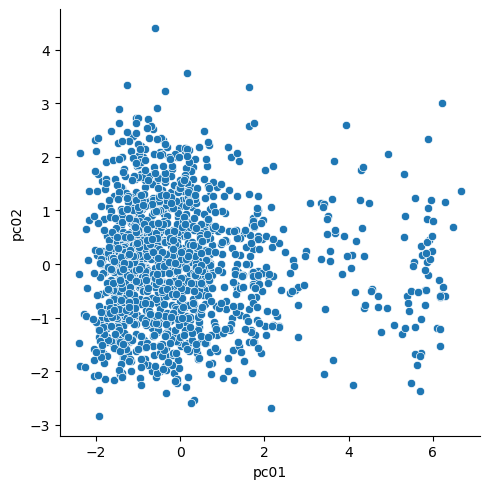

In [79]:
sns.relplot(data=pca_pitt_df, x = 'pc01', y = 'pc02')

plt.show()

The shape of this visualization is very similar to the age compared to the drivetime variables

### Clustering the PCA

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


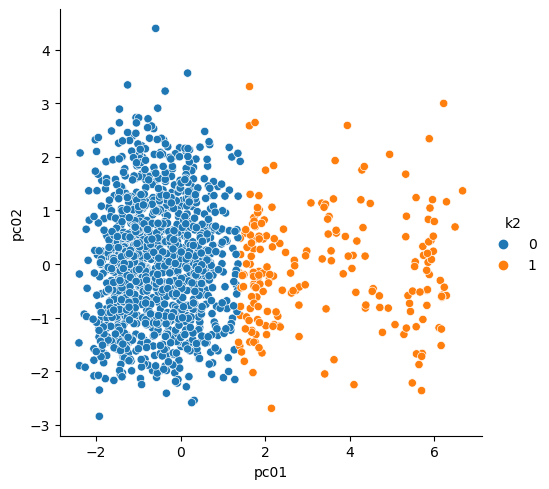

In [80]:
pca_pitt_df['k2'] = pd.Series( pitt_clusters_2, index=pca_pitt_df.index ).astype('category')

sns.relplot(data = pca_pitt_df, x='pc01', y='pc02', hue='k2')

plt.show()

As you can see below, this visualization very closely reflects the distance and drive time relative to age. 

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


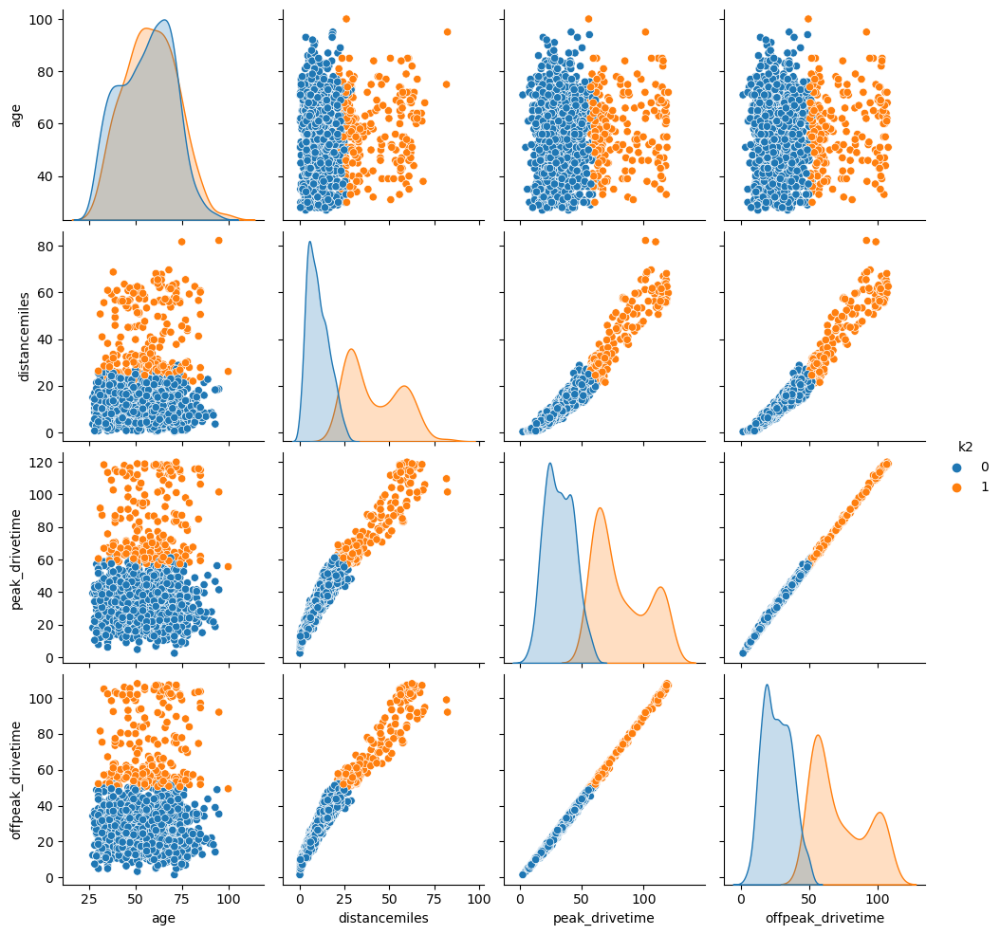

In [81]:
sns.pairplot(data = df_clean_NM_copy, hue = 'k2',vars=['age', 'distancemiles', 'peak_drivetime', 'offpeak_drivetime'],diag_kws={'common_norm':False})

plt.show()

Based on this comparison, it appears that when 2 clusters are selected, the dataponts are divided by drivetime as the main variable. 

Due to the nature of our problem, it is clear that we cannot by clustering alone determine who will renew vs not renew their season tickets.

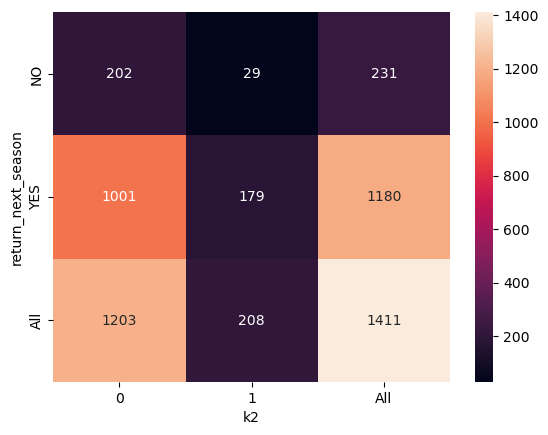

In [82]:
fig, ax = plt.subplots()

sns.heatmap( pd.crosstab( df_clean_NM_copy.return_next_season, df_clean_NM_copy.k2, margins=True ), ax = ax,
             annot=True, fmt='g')

plt.show()


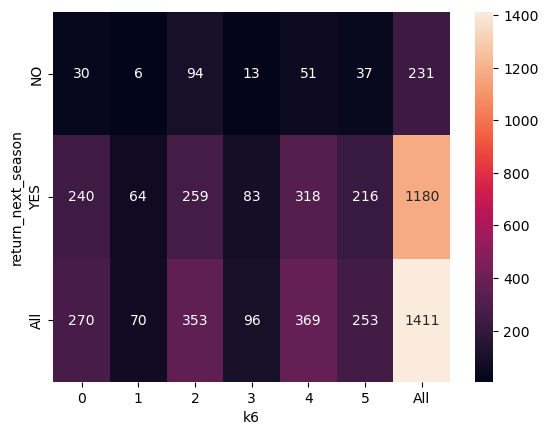

In [83]:
fig, ax = plt.subplots()

sns.heatmap( pd.crosstab( df_clean_NM_copy.return_next_season, df_clean_NM_copy.k6, margins=True ), ax = ax,
             annot=True, fmt='g')

plt.show()
